In [1]:
import os
import random
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt


In [2]:
# Root where all datasets live
DATASETS_ROOT = Path(r"E:\ROBOTRONIX\Learning Period\datasets")

In [3]:
def load_yolo_labels(label_path, img_w, img_h):
    """
    Returns list of boxes: (cls, x1, y1, x2, y2)
    """
    boxes = []
    if not label_path.exists():
        return boxes

    with open(label_path, "r") as f:
        for line in f:
            cls, cx, cy, w, h = map(float, line.strip().split())

            cx *= img_w
            cy *= img_h
            w *= img_w
            h *= img_h

            x1 = int(cx - w / 2)
            y1 = int(cy - h / 2)
            x2 = int(cx + w / 2)
            y2 = int(cy + h / 2)

            boxes.append((int(cls), x1, y1, x2, y2))

    return boxes


def draw_boxes(img, boxes):
    for cls, x1, y1, x2, y2 in boxes:
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(
            img,
            f"{cls}",
            (x1, max(0, y1 - 5)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (0, 255, 0),
            2,
        )
    return img


In [4]:
def visualize_dataset_grid(
    images_dir,
    labels_dir,
    rows=3,
    cols=4,
    fig_scale=4,
):

    image_files = list(images_dir.glob("*"))
    assert len(image_files) >= rows * cols, "Not enough images"

    sampled_images = random.sample(image_files, rows * cols)

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(cols * fig_scale, rows * fig_scale)
    )

    axes = axes.flatten()

    for ax, img_path in zip(axes, sampled_images):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        h, w, _ = img.shape
        label_path = labels_dir / f"{img_path.stem}.txt"

        boxes = load_yolo_labels(label_path, w, h)
        img = draw_boxes(img, boxes)

        ax.imshow(img)
        ax.set_title(img_path.name, fontsize=10)
        ax.axis("off")

    plt.tight_layout()
    plt.show()


In [13]:
DATASET_NAME = "dataset-1"

SPLIT = "train"

IMAGES_DIR = DATASETS_ROOT / DATASET_NAME / SPLIT / "images"
LABELS_DIR = DATASETS_ROOT / DATASET_NAME / SPLIT / "labels"

assert IMAGES_DIR.exists(), f"{IMAGES_DIR} not found"
assert LABELS_DIR.exists(), f"{LABELS_DIR} not found"

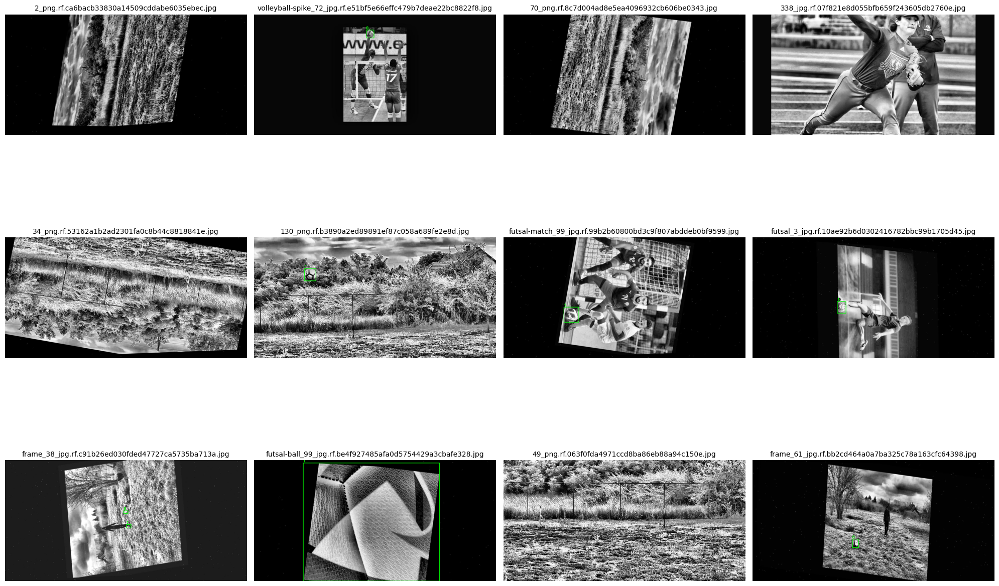

In [14]:
visualize_dataset_grid(
    IMAGES_DIR,
    LABELS_DIR,
    rows=3,
    cols=4,
    fig_scale=5  # HD
)


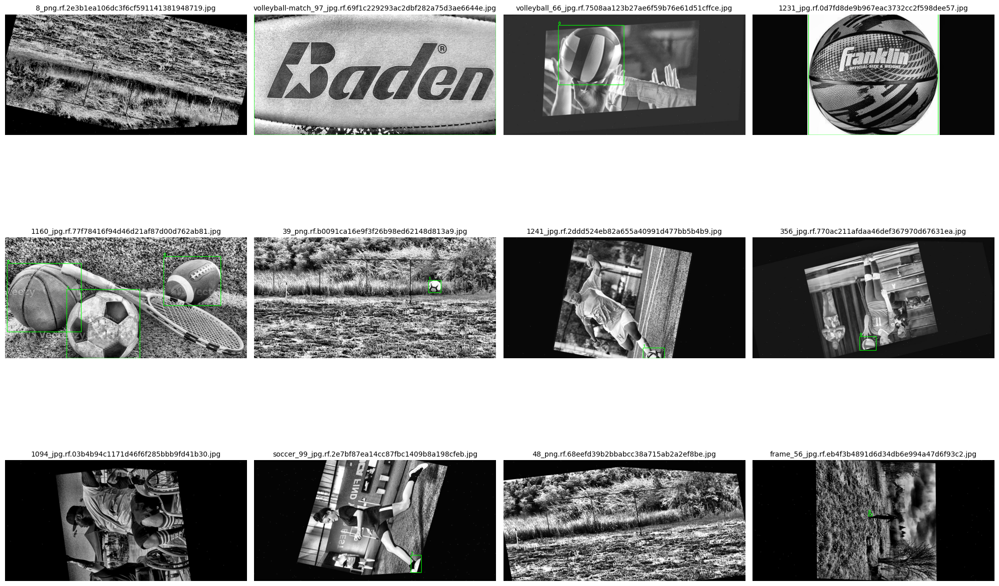

In [15]:
visualize_dataset_grid(
    IMAGES_DIR,
    LABELS_DIR,
    rows=3,
    cols=4,
    fig_scale=5  # HD
)


In [8]:
DATASET_NAME = "dataset-2"

SPLIT = "train"

IMAGES_DIR = DATASETS_ROOT / DATASET_NAME / SPLIT / "images"
LABELS_DIR = DATASETS_ROOT / DATASET_NAME / SPLIT / "labels"

assert IMAGES_DIR.exists(), f"{IMAGES_DIR} not found"
assert LABELS_DIR.exists(), f"{LABELS_DIR} not found"

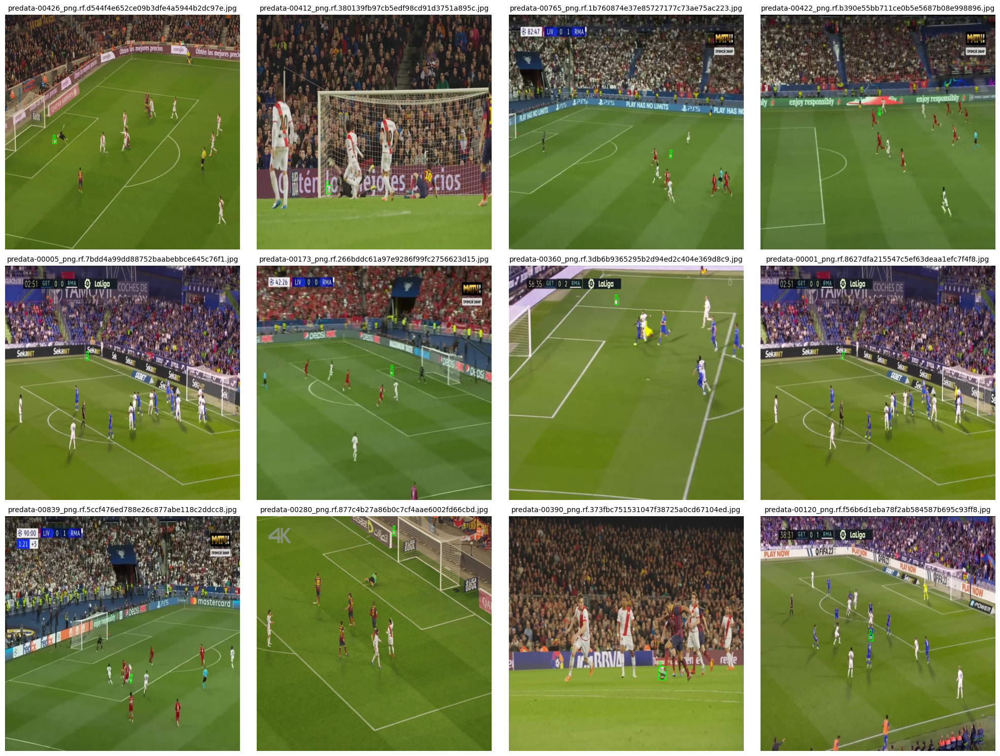

In [9]:
visualize_dataset_grid(
    IMAGES_DIR,
    LABELS_DIR,
    rows=3,
    cols=4,
    fig_scale=5  # HD
)


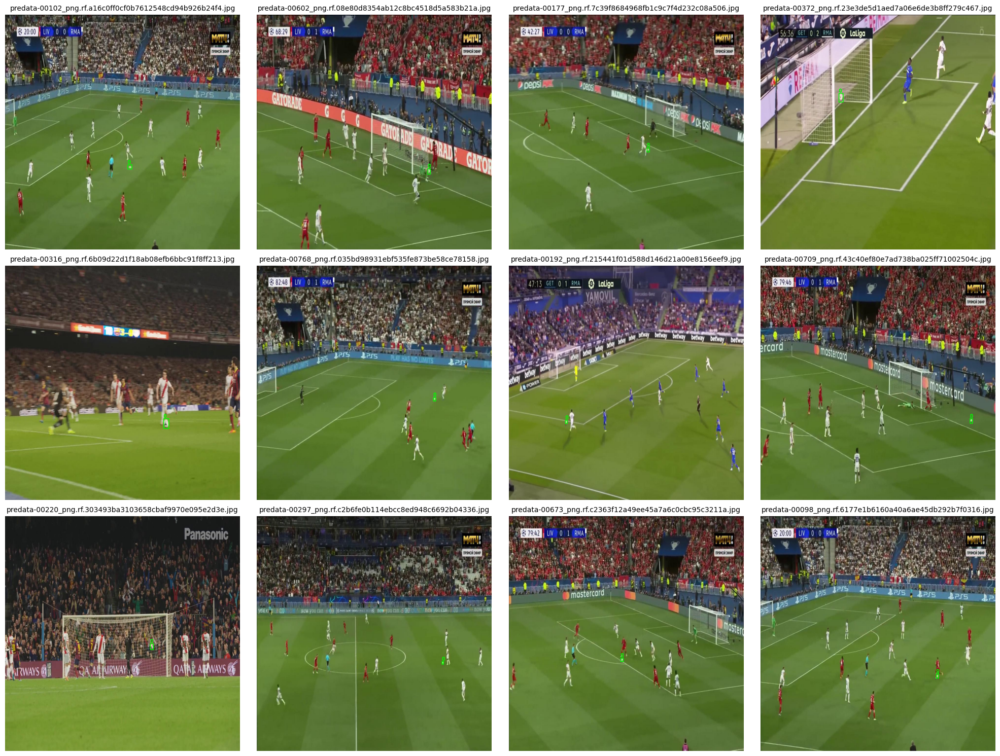

In [10]:
visualize_dataset_grid(
    IMAGES_DIR,
    LABELS_DIR,
    rows=3,
    cols=4,
    fig_scale=5  # HD
)


### Next

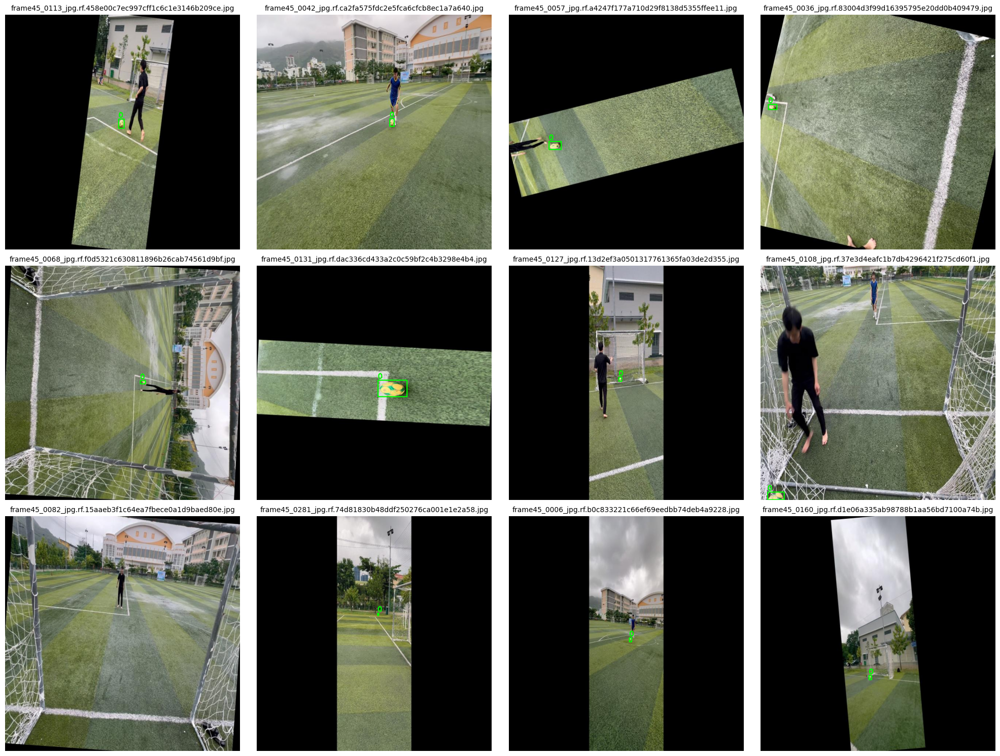

In [11]:
DATASET_NAME = "dataset-3"

SPLIT = "train"

IMAGES_DIR = DATASETS_ROOT / DATASET_NAME / SPLIT / "images"
LABELS_DIR = DATASETS_ROOT / DATASET_NAME / SPLIT / "labels"

assert IMAGES_DIR.exists(), f"{IMAGES_DIR} not found"
assert LABELS_DIR.exists(), f"{LABELS_DIR} not found"

visualize_dataset_grid(
    IMAGES_DIR,
    LABELS_DIR,
    rows=3,
    cols=4,
    fig_scale=5  # HD
)


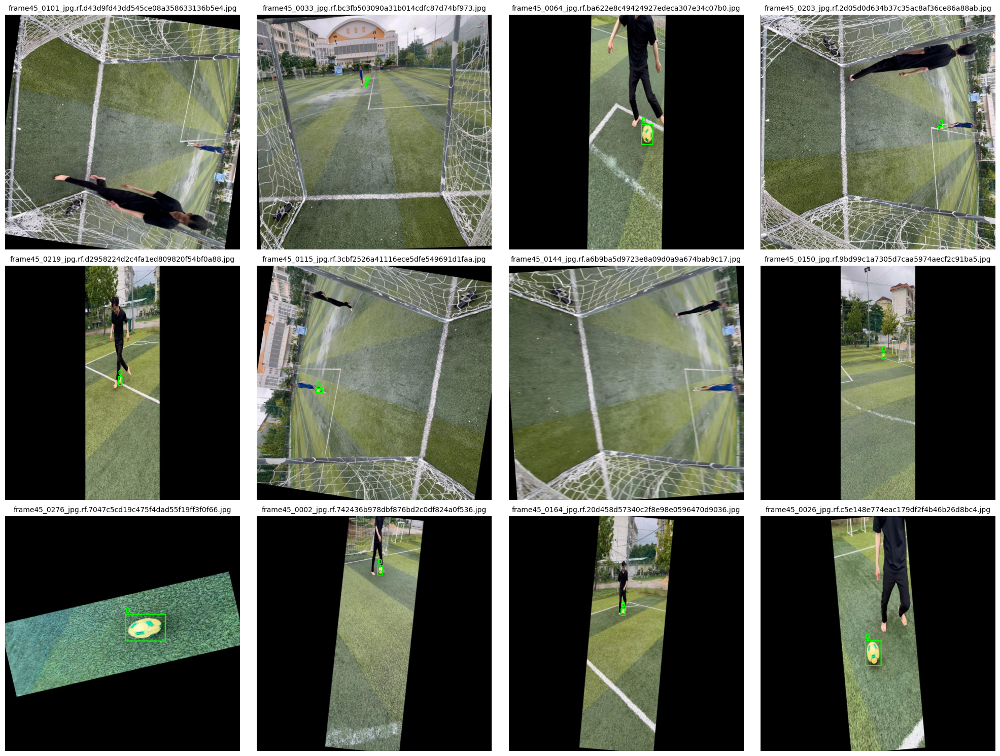

In [12]:
visualize_dataset_grid(
    IMAGES_DIR,
    LABELS_DIR,
    rows=3,
    cols=4,
    fig_scale=5  # HD
)


# Discard dataset-1 and merge 2 and 3

In [16]:
import shutil
from pathlib import Path

# ===== CONFIG =====
DATASETS = [
    DATASETS_ROOT / "dataset-2",
    DATASETS_ROOT / "dataset-3",
]

OUTPUT = DATASETS_ROOT / "final-farball-dataset"
SPLITS = ["train", "valid", "test"]
SUBDIRS = ["images", "labels"]

# ==================

def mkdir(p: Path):
    p.mkdir(parents=True, exist_ok=True)

# Create output dirs
for split in SPLITS:
    for sub in SUBDIRS:
        mkdir(OUTPUT / split / sub)

def merge_split(src_root: Path, split: str):
    img_src = src_root / split / "images"
    lbl_src = src_root / split / "labels"

    img_dst = OUTPUT / split / "images"
    lbl_dst = OUTPUT / split / "labels"

    prefix = src_root.name

    for img_path in img_src.glob("*"):
        if not img_path.is_file():
            continue

        new_name = f"{prefix}_{img_path.name}"
        lbl_path = lbl_src / (img_path.stem + ".txt")

        shutil.copy2(img_path, img_dst / new_name)

        if lbl_path.exists():
            shutil.copy2(lbl_path, lbl_dst / (prefix + "_" + lbl_path.name))
        else:
            print(f"⚠️ Missing label for {img_path}")

# Merge all datasets
for ds in DATASETS:
    print(f"🔹 Merging {ds}")
    for split in SPLITS:
        merge_split(ds, split)

print("✅ Dataset merge complete!")


🔹 Merging E:\ROBOTRONIX\Learning Period\datasets\dataset-2
🔹 Merging E:\ROBOTRONIX\Learning Period\datasets\dataset-3
✅ Dataset merge complete!
